# E9 241 Digital Image Processing - Assignment 3
***
*Submitted by: Dwaipayan Haldar*<br>
*S.R. No. : 27128*

In [2]:
import numpy as np
import skimage
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from scipy.fft import fft2, fftshift, ifft2, ifftshift
from skimage.util import img_as_float

from src.P01_Directional_Filtering import *
from src.P02_Gaussian_Blurring_Inverse_Filtering import *

## Problem 1: Directional Filtering

### Problem 1.(a)

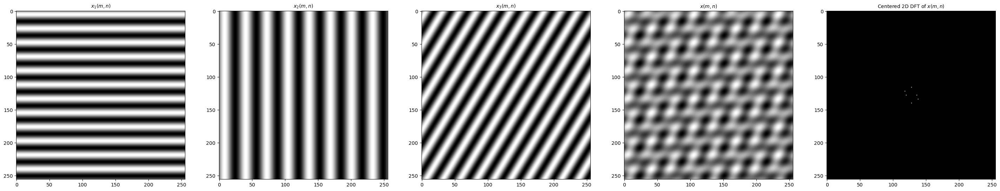

In [2]:
vertical_image = vertical_sin(256)
horizontal_image = horizontal_sin(256)
diagonal_image = diagonal_sin(256)

combined_image = (vertical_image+horizontal_image+diagonal_image)/3

fft_combined_image = fft2(combined_image)
fft_combined_image = fftshift(fft_combined_image)

plt.figure(figsize=(36,28))
plt.subplot(1, 5, 1)
plt.title(r"$x_1(m,n)$", fontsize=10)
plt.imshow(vertical_image, cmap='gray')
plt.subplot(1, 5, 2)
plt.title(r"$x_2(m,n)$", fontsize=10)
plt.imshow(horizontal_image, cmap='gray')
plt.subplot(1, 5, 3)
plt.title(r"$x_3(m,n)$", fontsize=10)
plt.imshow(diagonal_image, cmap='gray')
plt.subplot(1, 5, 4)
plt.title(r"$x(m,n)$", fontsize=10)
plt.imshow(combined_image, cmap='gray')
plt.subplot(1, 5, 5)
plt.title(r"Centered 2D DFT of $x(m,n)$", fontsize=10)
plt.imshow(np.log1p(np.abs(fft_combined_image)**0.5), cmap='gray')
plt.show()


### Problem 1.(b)

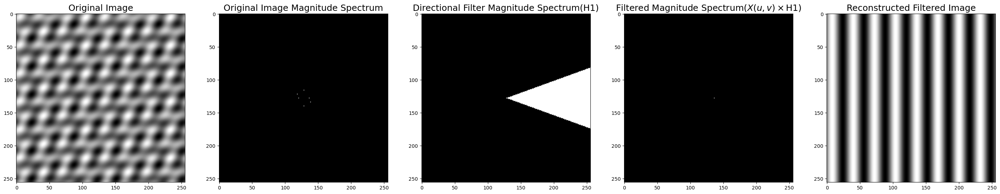

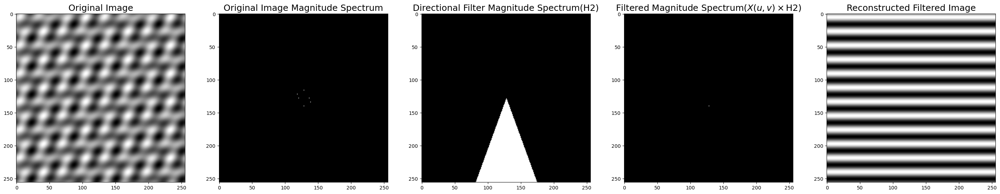

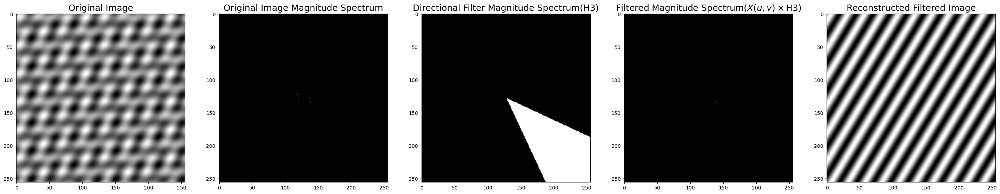

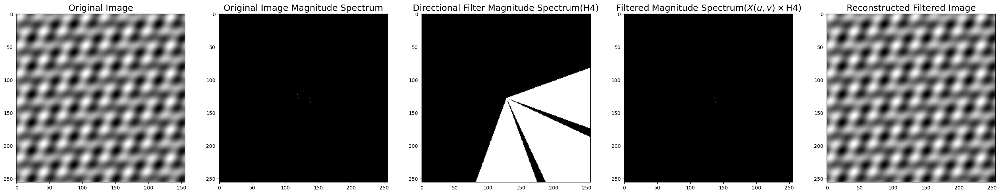

In [3]:
H_1 = directional_filter(fft_combined_image, -20,20)
H_2 = directional_filter(fft_combined_image, 70,110)
H_3 = directional_filter(fft_combined_image, 25,65)
H_4 = np.maximum(H_1, np.maximum(H_2,H_3))

filter_name ={'H1':H_1, 'H2': H_2, 'H3':H_3, 'H4': H_4}

for filter, i in filter_name.items():
    filtered_image_frequency = fft_combined_image*i
    filtered_image_frequency_shift = ifftshift(filtered_image_frequency)
    filtered_image = ifft2(filtered_image_frequency_shift)
    plt.figure(figsize=(36,28))
    plt.subplot(1,5,1)
    plt.title("Original Image", fontsize = 18)
    plt.imshow(combined_image, cmap='gray')
    plt.subplot(1,5,2)
    plt.title("Original Image Magnitude Spectrum", fontsize = 18)
    plt.imshow(np.log1p(np.abs(fft_combined_image)**0.5), cmap='gray')
    plt.subplot(1,5,3)
    plt.title(f"Directional Filter Magnitude Spectrum({filter})", fontsize = 18)
    plt.imshow(np.log1p(np.abs(i)**0.5), cmap = 'gray')
    plt.subplot(1,5,4)
    plt.title(r"Filtered Magnitude Spectrum($X(u,v)\times$" + f"{filter})", fontsize = 18)
    plt.imshow(np.log1p(np.abs(filtered_image_frequency)**0.5), cmap = 'gray')
    plt.subplot(1,5,5)
    plt.title("Reconstructed Filtered Image", fontsize = 18)
    plt.imshow(np.real(filtered_image), cmap = 'gray')
    plt.show()
    

### Problem 1.(c)

In [4]:
for filter, i in filter_name.items():
    filtered_image_frequency = fft_combined_image*i
    filtered_image_frequency_shift = ifftshift(filtered_image_frequency)
    filtered_image = ifft2(filtered_image_frequency_shift)
    print(f"The MSE for {filter} is", mse(combined_image, np.real(filtered_image)))

The MSE for H1 is 0.125
The MSE for H2 is 0.125
The MSE for H3 is 0.125
The MSE for H4 is 0.04166666666666666


### Problem 1.(c) Matching Theoritical Calculations

In [7]:
MSE_theoritical_H1 = mse(combined_image, horizontal_image/6)
print("The MSE calculated theoritically for H1:", MSE_theoritical_H1)
MSE_theoritical_H2 = mse(combined_image, vertical_image/6)
print("The MSE calculated theoritically for H2:", MSE_theoritical_H2)
MSE_theoritical_H3 = mse(combined_image, diagonal_image/6)
print("The MSE calculated theoritically for H3:", MSE_theoritical_H3)
MSE_theoritical_H4 = mse(combined_image, combined_image/2)
print("The MSE calculated theoritically for H4:", MSE_theoritical_H4)

The MSE calculated theoritically for H1: 0.125
The MSE calculated theoritically for H2: 0.125
The MSE calculated theoritically for H3: 0.125
The MSE calculated theoritically for H4: 0.04166666666666668


## Problem 2: Gaussian Blurring and Inverse Filtering

### Problem 2.(a)

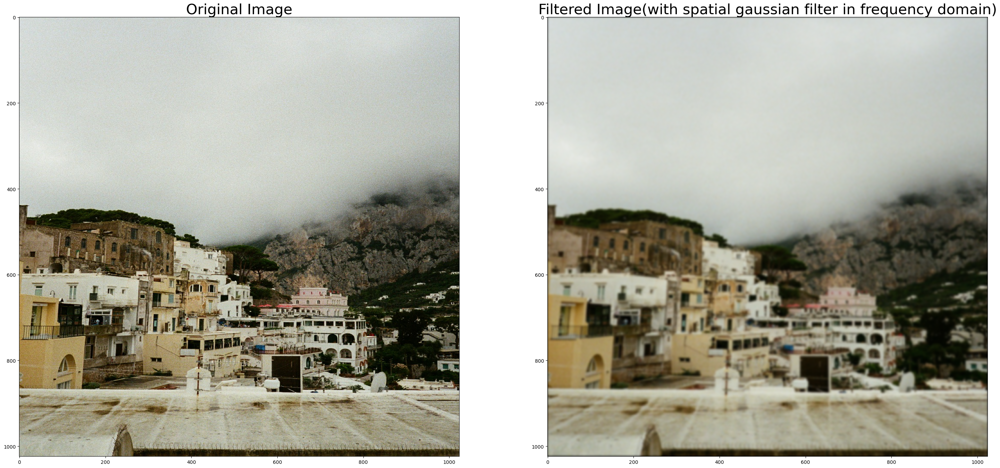

In [19]:
building_img = img_as_float(skimage.io.imread('images/buildings.jpg'))

G_kernel_td = gaussian_filter_td()

padding_width = (building_img.shape[0])//2
padding_width_img = (G_kernel_td.shape[0])//2
G_kernel_td_padded = np.pad(G_kernel_td, ((padding_width,padding_width-1),(padding_width,padding_width-1)))
G_kernel_td_padded = ifftshift(G_kernel_td_padded)
G_kernel_fd = fft2(G_kernel_td_padded)

building_img_filtered_fft_list = []
building_img_filtered = np.zeros_like(building_img)

for i in range(3):
    building_img_padded = np.pad(building_img[:,:,i],((padding_width_img,padding_width_img),(padding_width_img,padding_width_img)))
    building_img_fd = fft2(building_img_padded)
    building_filtered_img = building_img_fd*G_kernel_fd
    building_img_filtered_fft_list.append(building_filtered_img)
    building_img_filtered[:,:,i] = np.real(ifft2(building_filtered_img))[padding_width_img:(building_filtered_img.shape[0]-padding_width_img),padding_width_img:(building_filtered_img.shape[0]-padding_width_img)]


plt.figure(figsize=(36,30))
plt.subplot(1,2,1)
plt.title("Original Image",fontsize = 30)
plt.imshow(building_img)
plt.subplot(1,2,2)
plt.title("Filtered Image(with spatial gaussian filter in frequency domain)", fontsize = 30)
plt.imshow(building_img_filtered)
plt.show()

### Problem 2.(b)

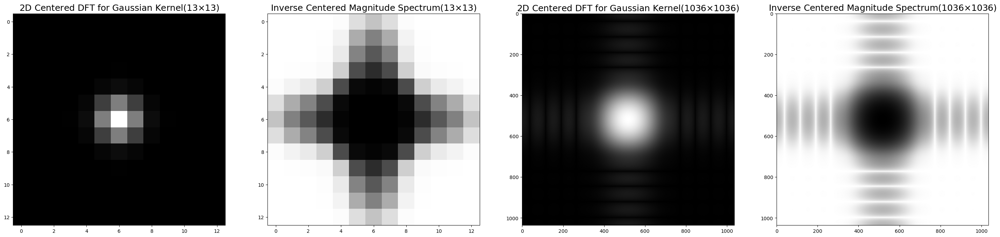

In [20]:
G_kernel_td = gaussian_filter_td() 
G_kernel_fd = fftshift(fft2(G_kernel_td)) #2.(b).(i)
G_kernel_fd_inverse = 1/(np.abs(G_kernel_fd)+ 1e-3) #2.(b).(ii)

padding_width = (building_img.shape[0])//2
G_kernel_td_padded = np.pad(G_kernel_td, ((padding_width,padding_width-1),(padding_width,padding_width-1)))
G_kernel_td_padded = ifftshift(G_kernel_td_padded)
G_kernel_fd_padded = fftshift(fft2(G_kernel_td_padded)) #2.(b).(iii)
G_kernel_fd_padded_inverse = 1/(np.abs(G_kernel_fd_padded)+ 1e-3) #2.(b).(iv)

plt.figure(figsize=(36,30))
plt.subplot(1,4,1)
plt.title(r"2D Centered DFT for Gaussian Kernel(13$\times$13)", fontsize = 18)
plt.imshow(np.abs(G_kernel_fd), cmap = 'gray')
plt.subplot(1,4,2)
plt.title(r"Inverse Centered Magnitude Spectrum(13$\times$13)", fontsize = 18)
plt.imshow(G_kernel_fd_inverse, cmap = 'gray')
plt.subplot(1,4,3)
plt.title(r"2D Centered DFT for Gaussian Kernel(1036$\times$1036)", fontsize = 18)
plt.imshow(np.log1p(np.abs(G_kernel_fd_padded)**0.5), cmap = 'gray')
plt.subplot(1,4,4)
plt.title(r"Inverse Centered Magnitude Spectrum(1036$\times$1036)", fontsize = 18)
plt.imshow(np.log1p(np.abs(G_kernel_fd_padded_inverse)), cmap = 'gray')
plt.show()

### Problem 2.(c): Gaussian Frequency Response Fit

Minimum Error 7.689320928228115
K_optimal 0.00011300000000000001


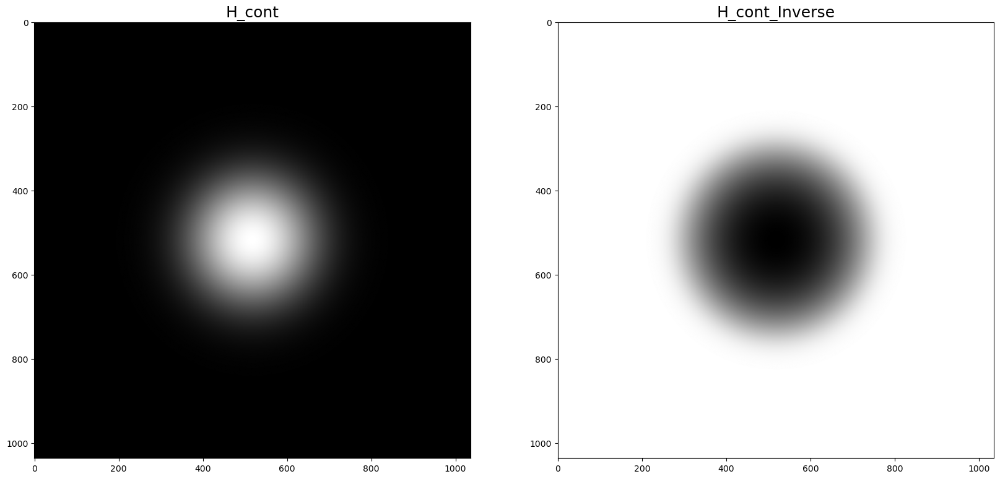

In [24]:
error_min = np.inf
k_min = 0

for k in np.linspace(1e-6, 1e-3, 1000):
    M,N = G_kernel_fd_padded.shape
    H_cont = gaussian_filter_fd(k, M, N)
    error = np.sum(np.abs(H_cont-np.abs(G_kernel_fd_padded))**2)
    if error < error_min:
        error_min = error
        k_min = k

print("Minimum Error", error_min)
print("K_optimal", k_min)

H_cont = gaussian_filter_fd(k_min, 1036,1036)
H_cont_inverse = 1/(np.abs(H_cont)+ 1e-3)

plt.figure(figsize = (20,16))
plt.subplot(1,2,1)
plt.title("H_cont", fontsize = 18)
plt.imshow(np.log1p(np.abs(H_cont)**0.5), cmap = 'gray')
plt.subplot(1,2,2)
plt.title("H_cont_Inverse", fontsize = 18)
plt.imshow(np.log1p(np.abs(H_cont_inverse)**0.5), cmap = 'gray')
plt.show()

### Problem 2.(d)

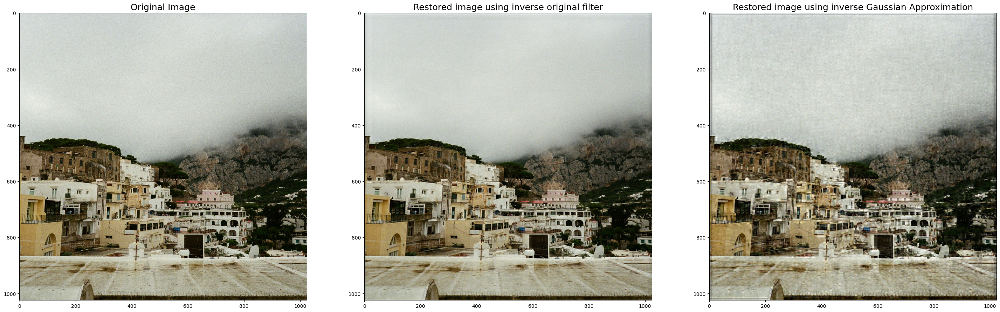

The MSE between the original and the Inverse original filter is: 0.0026669267566353234
The MSE between the original and the Inverse Gaussian fit filter is: 0.010928563053718435


In [25]:
G_kernel_fd_padded_uncentered = ifftshift(G_kernel_fd_padded_inverse)
H_cont_inverse_uncentered = ifftshift(H_cont_inverse)
building_img_restored_G = np.zeros_like(building_img)
building_img_restored_H = np.zeros_like(building_img)

for i in range(3):
   building_img_fd = building_img_filtered_fft_list[i]
   building_img_restored_filtered_G = building_img_fd*G_kernel_fd_padded_uncentered
   building_img_restored_filtered_H = building_img_fd*H_cont_inverse_uncentered
   building_img_restored_G[:,:,i] = np.real(ifft2(building_img_restored_filtered_G))[padding_width_img:(building_filtered_img.shape[0]-padding_width_img),padding_width_img:(building_filtered_img.shape[0]-padding_width_img)]
   building_img_restored_H[:,:,i] = np.real(ifft2(building_img_restored_filtered_H))[padding_width_img:(building_filtered_img.shape[0]-padding_width_img),padding_width_img:(building_filtered_img.shape[0]-padding_width_img)] 

building_img_restored_G = np.clip(building_img_restored_G, 0,1)
building_img_restored_H = np.clip(building_img_restored_H, 0,1)

plt.figure(figsize=(36,30))
plt.subplot(1,3,1)
plt.title("Original Image",fontsize = 18)
plt.imshow(building_img)
plt.subplot(1,3,2)
plt.title("Restored image using inverse original filter", fontsize = 18)
plt.imshow(building_img_restored_G)
plt.subplot(1,3,3)
plt.title("Restored image using inverse Gaussian Approximation", fontsize = 18)
plt.imshow(building_img_restored_H)
plt.show()


print("The MSE between the original and the Inverse original filter is:", mse(building_img, building_img_restored_G))
print("The MSE between the original and the Inverse Gaussian fit filter is:", mse(building_img, building_img_restored_H))